# MSCI623 Project Title: <br>
# Dry Bean Classification using Machine Learning Algorithm and Computer vision techniques

## **1. Introduction**

Reliable computer vision techniques are the need of an hour for faster and accurate sorting and
processing of goods in the variety of industries. And to develop accurate computer vision, we can
leverage state-of-the-art data-driven machine learning techniques and help machine decide and
improve on its own for future outcome variable predictions. And particularly in the agricultural
industry, if we can develop an accurate machine learning model to classify the types of dry beans
based on the features detected by the imaging, then we can accurately apply it to augment computer
vision and automation at various stages of agricultural goods production life cycle. <br>

Therefore, in this project, I would like to build a supervised machine learning classification model
which provides most accurate prediction for the type of Dry Beans based on its attributes (dimensions
and shape forms). To train my machine learning model, I will use the dataset created by KOKLU, M.
and OZKAN, I.A. through various dry beans samples’ imaging and morphological measurements [1].
And I have downloaded this dataset from publicly accessible UCI Machine Learning Repository [2].

## **2. Data Exploration**

#### *Brief overview of Dataset:*

This dataset includes 16 morphological attributes of dry beans as predictor
variables. And outcome variable that I would like to predict is a dry bean “Class” which will have one
of the following 7 categorical values/ types: Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and
Sira.

Our dataset has following number of rows and columns: <br>
Number of Rows: 13611 <br>
Number of Columns: 17

Following is the description of each Attribute used in dataset:<br>
1.) Area (A): The area of a bean zone and the number of pixels within its boundaries.<br>
2.) Perimeter (P): Bean circumference is defined as the length of its border.<br>
3.) Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.<br>
4.) Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.<br>
5.) Aspect ratio (K): Defines the relationship between L and l.<br>
6.) Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.<br>
7.) Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.<br>
8.) Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.<br>
9.) Extent (Ex): The ratio of the pixels in the bounding box to the bean area.<br>
10.) Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.<br>
11.) Roundness (R): Calculated with the following formula: (4piA)/(P^2)<br>
12.) Compactness (CO): Measures the roundness of an object: Ed/L<br>
13.) ShapeFactor1 (SF1)<br>
14.) ShapeFactor2 (SF2)<br>
15.) ShapeFactor3 (SF3)<br>
16.) ShapeFactor4 (SF4)<br>
17.) Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

So, fields 1 to 16 provides various morphological attributes of dry beans in terms of various size, shape, form, and its structure informations. So in this supervised learning problem, we will call fields 1 to 16 as our predictor/ feature variables and field 17 as our outcome class variable.

#### *Data Exploration in Detail:*

In [ ]:
# importing the libraries
import pandas as pd 
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import math

In [ ]:
# Machine Learning Imports

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz

from sklearn.neighbors import KNeighborsClassifier

from sklearn import metrics
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

In [ ]:
# some other plotting related settings
sns.set(color_codes=True)
sns.set_style('whitegrid')
%matplotlib inline

In [ ]:
# imported dataset from url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00602/DryBeanDataset.zip"
# and extracted excel file from the zip folder and kept in the same folder as this jupyter notebook in case of running anaconda
# if running from google colab then this excel file to be kept in runtime temporary file to read excel data using following file name directly
df = pd.read_excel("Dry_Bean_Dataset.xlsx")

# check dataset's first 10 instances
df.head(10)    

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
7,30519,629.727,212.996755,182.737204,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER
8,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER
9,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,SEKER


In [ ]:
print(df['Class'].unique())

['SEKER' 'BARBUNYA' 'BOMBAY' 'CALI' 'HOROZ' 'SIRA' 'DERMASON']


So, these are the seven dry bean classes we need to predict based on other 16 feature columns

In [ ]:
# check df dataframe rows x columns counts
df.shape

(13611, 17)

Which means: <br>
Number of Rows: 13611 and <br>
Number of Columns: 17

In [ ]:
# check df dataframe summary information each columnwise
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

As our features are properly in 'float64' or 'int' data type, we dont need any conversion. Also, our outcome variable 'Class' has correct data type.

In [ ]:
# check major statistical summary of all numeric feature columns
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6cd2c839d0>,
      dtype=object)

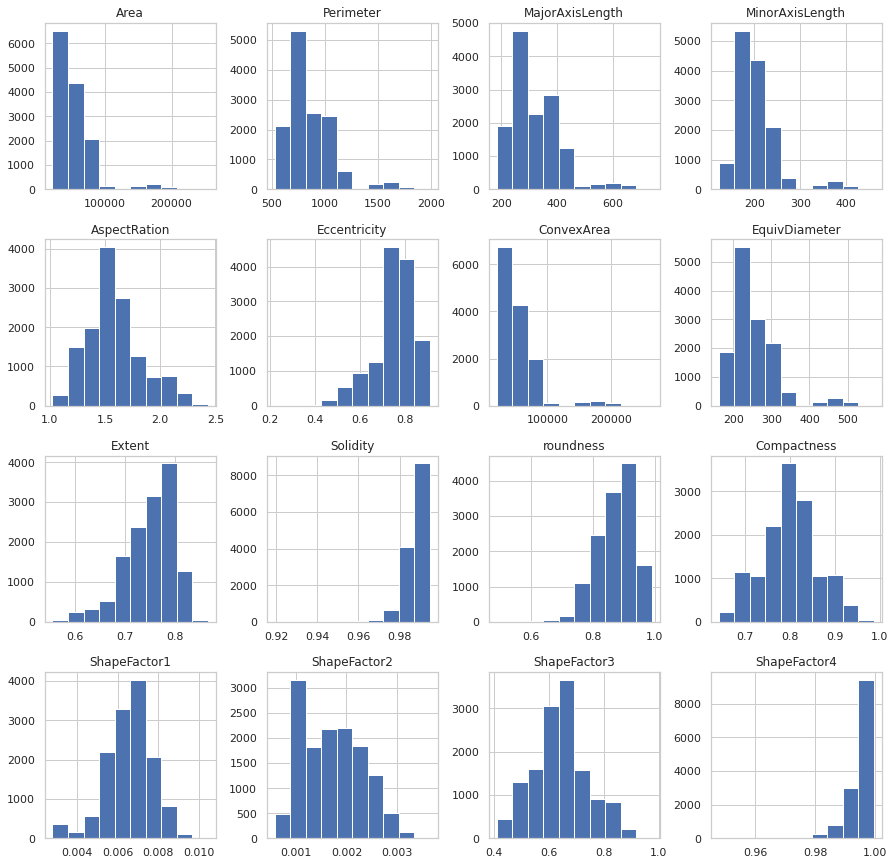

In [ ]:
# we can also observe histogram for each feature to know frequency for each range in feature data
df.hist(figsize=(15,15))

#### Now, checking for duplicate instances in dataset:

As our features data are recorded with high precision, it is very unlikely that two instances would have exact same values. Therefore, we can remove this 68 duplicate instances from our dataset.

In [ ]:
# removing duplicate rows
df = df.drop_duplicates(keep='first') #keeping first occurences only in case of duplicated rows

print("Count after Removing Duplicates: ")
df.shape

Count after Removing Duplicates: 


(13543, 17)

#### Checking for Null Values:

In [ ]:
# checking for null values
print(df.isnull().sum())

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64


So, we can conclude that there is no null values in our dataset.

#### Now, checking for outliers in data:

In [ ]:
# getting class-wise mean of feautures
df.groupby('Class').mean()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Class,,,,,,,,,,,,,,,,
BARBUNYA,69804.133132,1046.105764,370.044279,240.309352,1.544395,0.754665,71025.729198,297.311018,0.749273,0.982804,0.800200,0.805001,0.005357,0.001394,0.649144,0.995739
BOMBAY,173485.059387,1585.619079,593.152075,374.352547,1.585550,0.770518,175813.116858,468.941426,0.776559,0.986902,0.864421,0.792622,0.003442,0.000844,0.629195,0.991841
CALI,75538.211043,1057.634282,409.499538,236.370616,1.733663,0.814804,76688.503067,309.535280,0.758953,0.985021,0.845934,0.756703,0.005459,0.001107,0.573022,0.990584
DERMASON,32118.710942,665.209536,246.557279,165.657143,1.490471,0.736632,32498.435138,201.683813,0.752953,0.988226,0.908114,0.819110,0.007755,0.002161,0.671636,0.996914
HOROZ,53671.732796,920.108600,372.693927,184.197789,2.026532,0.867482,54463.101075,260.791645,0.705512,0.985486,0.794374,0.700818,0.007005,0.001047,0.491708,0.991922
SEKER,39881.299951,727.672440,251.291957,201.909653,1.245182,0.584781,40269.567341,224.948441,0.771674,0.990351,0.944508,0.896841,0.006334,0.002541,0.805149,0.998383
SIRA,44729.128604,796.418737,299.380258,190.800250,1.570083,0.767277,45273.099772,238.335316,0.749445,0.987971,0.884652,0.797345,0.006720,0.001683,0.636358,0.995385


It's apparently seen that BOMBAY class is the reason for our outliers in data. <br>
Also, we can further investigate outliers through following procedure

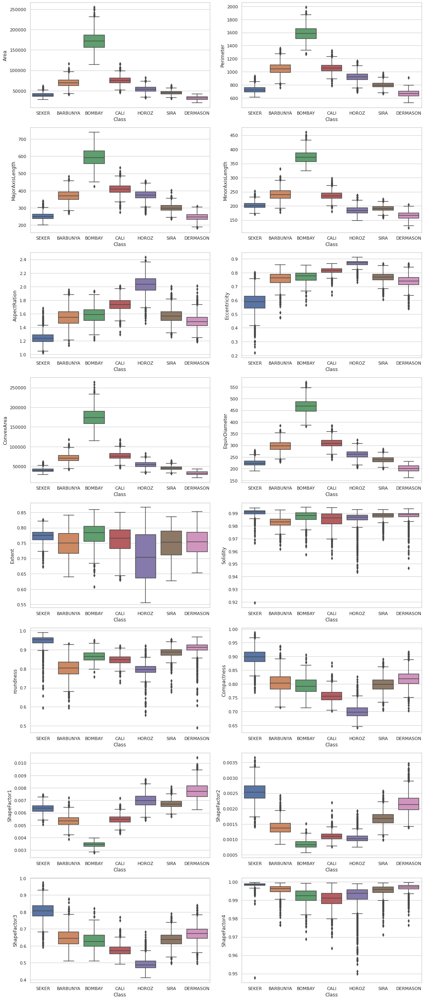

In [ ]:
# create feature-wise subplot showing boxplot of each class in it
fig, ax = plt.subplots(8, 2, figsize=(15, 35))

# define X as features, and remove class variable from it
X = df.drop(['Class'],axis=1)

# create subplots
for variable, subplot in zip(X.columns, ax.flatten()):
    sns.boxplot(x=df.Class, y= df[variable], ax=subplot)
plt.tight_layout()

So, our above subplots manifest what we already discussed above that in most of the attributes, "Bombay" class is the reason for outliers.

To further check outliers in features, we can also plot each feature with aggregate or combined class data, as done below.

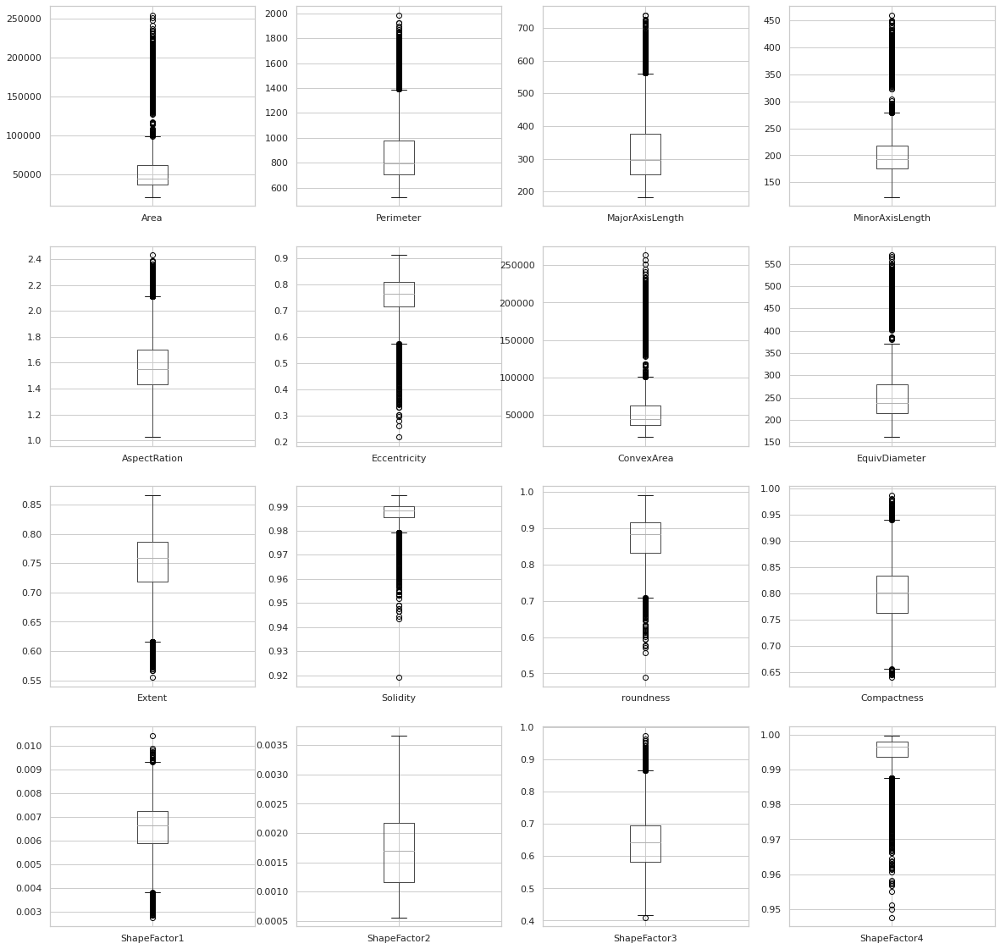

In [ ]:
#visualizing outliers in features
fig, ax = plt.subplots(4, 4, figsize=(20, 20))

for column, subplot in zip(df.columns[0:16],ax.flatten()):
    df.boxplot([column],ax=subplot)

This boxplots shows that we have outliers in most of the features.

In [ ]:
# finding inter quartile range for each feature data
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Area               25099.500000
Perimeter            273.916500
MajorAxisLength      123.225682
MinorAxisLength       41.359046
AspectRation           0.273254
Eccentricity           0.094528
ConvexArea         25687.000000
EquivDiameter         64.627073
Extent                 0.068114
Solidity               0.004340
roundness              0.083621
Compactness            0.071242
ShapeFactor1           0.001377
ShapeFactor2           0.001014
ShapeFactor3           0.113823
ShapeFactor4           0.004171
dtype: float64


In [ ]:
# we can check and remove outliers/ points that are either:
#   - less than 1.5*IQR under Q1 OR 
#   - more than 1.5*IQR above Q3

df1 = df[ ~ ( (df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR) )).any(axis=1)]
df1.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  """


(10539, 17)

In [ ]:
# checking mean values of each attributes, after grouping rows by "class"
df1.groupby('Class').mean()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Class,,,,,,,,,,,,,,,,
BARBUNYA,69207.477486,1034.147346,368.999963,238.944776,1.547864,0.756856,70326.240150,296.135533,0.752256,0.984092,0.811390,0.804050,0.005380,0.001393,0.647485,0.996151
CALI,75077.747136,1052.021422,407.415049,235.764157,1.729183,0.813746,76033.873159,308.648246,0.761019,0.987420,0.850064,0.758401,0.005460,0.001118,0.575588,0.992483
DERMASON,32206.406873,665.253004,246.789537,165.951126,1.488952,0.736272,32578.970257,201.972770,0.753418,0.988485,0.910318,0.819498,0.007738,0.002160,0.672234,0.997012
HOROZ,53039.167493,907.028070,365.544327,185.021142,1.976517,0.861039,53722.443013,259.186763,0.721711,0.987233,0.807061,0.709899,0.006959,0.001095,0.504336,0.993959
SEKER,41069.439432,739.717886,259.932174,200.998055,1.293441,0.629279,41459.522139,228.307089,0.768895,0.990591,0.941153,0.879395,0.006362,0.002355,0.773807,0.998336
SIRA,44724.822618,795.979411,299.329997,190.779378,1.569973,0.767273,45259.046088,238.326389,0.749720,0.988179,0.885500,0.797438,0.006719,0.001683,0.636501,0.995575


In [ ]:
# however this entirely removes Class "Bombay", which is not acceptable
# so we will use 'df' dataframe only for our further model preparation, without removing outliers
df.groupby('Class').mean()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Class,,,,,,,,,,,,,,,,
BARBUNYA,69804.133132,1046.105764,370.044279,240.309352,1.544395,0.754665,71025.729198,297.311018,0.749273,0.982804,0.800200,0.805001,0.005357,0.001394,0.649144,0.995739
BOMBAY,173485.059387,1585.619079,593.152075,374.352547,1.585550,0.770518,175813.116858,468.941426,0.776559,0.986902,0.864421,0.792622,0.003442,0.000844,0.629195,0.991841
CALI,75538.211043,1057.634282,409.499538,236.370616,1.733663,0.814804,76688.503067,309.535280,0.758953,0.985021,0.845934,0.756703,0.005459,0.001107,0.573022,0.990584
DERMASON,32118.710942,665.209536,246.557279,165.657143,1.490471,0.736632,32498.435138,201.683813,0.752953,0.988226,0.908114,0.819110,0.007755,0.002161,0.671636,0.996914
HOROZ,53671.732796,920.108600,372.693927,184.197789,2.026532,0.867482,54463.101075,260.791645,0.705512,0.985486,0.794374,0.700818,0.007005,0.001047,0.491708,0.991922
SEKER,39881.299951,727.672440,251.291957,201.909653,1.245182,0.584781,40269.567341,224.948441,0.771674,0.990351,0.944508,0.896841,0.006334,0.002541,0.805149,0.998383
SIRA,44729.128604,796.418737,299.380258,190.800250,1.570083,0.767277,45273.099772,238.335316,0.749445,0.987971,0.884652,0.797345,0.006720,0.001683,0.636358,0.995385


In [ ]:
# check df dataframe rows x columns counts
df.shape

(13543, 17)

#### Checking for Class imbalance in dataset:

In [ ]:
# checking if our dataset has balanced classes figures
df['Class']. value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1860
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

As we can observe here that classes are little bit imbalanced, so apart from accuracy we will also find confusion matrix based model performance parameters like precision, recall, f1-score and support, in order to better judge model performace. <br>
Also, we can check model accuracy using stratified option while building model and Cross-validation, to have equal proportion of each class in all train and test dataset folds. And we will compare this accuracy with accuracy received through normal cross validation.

#### Checking for feature correlation and independence:

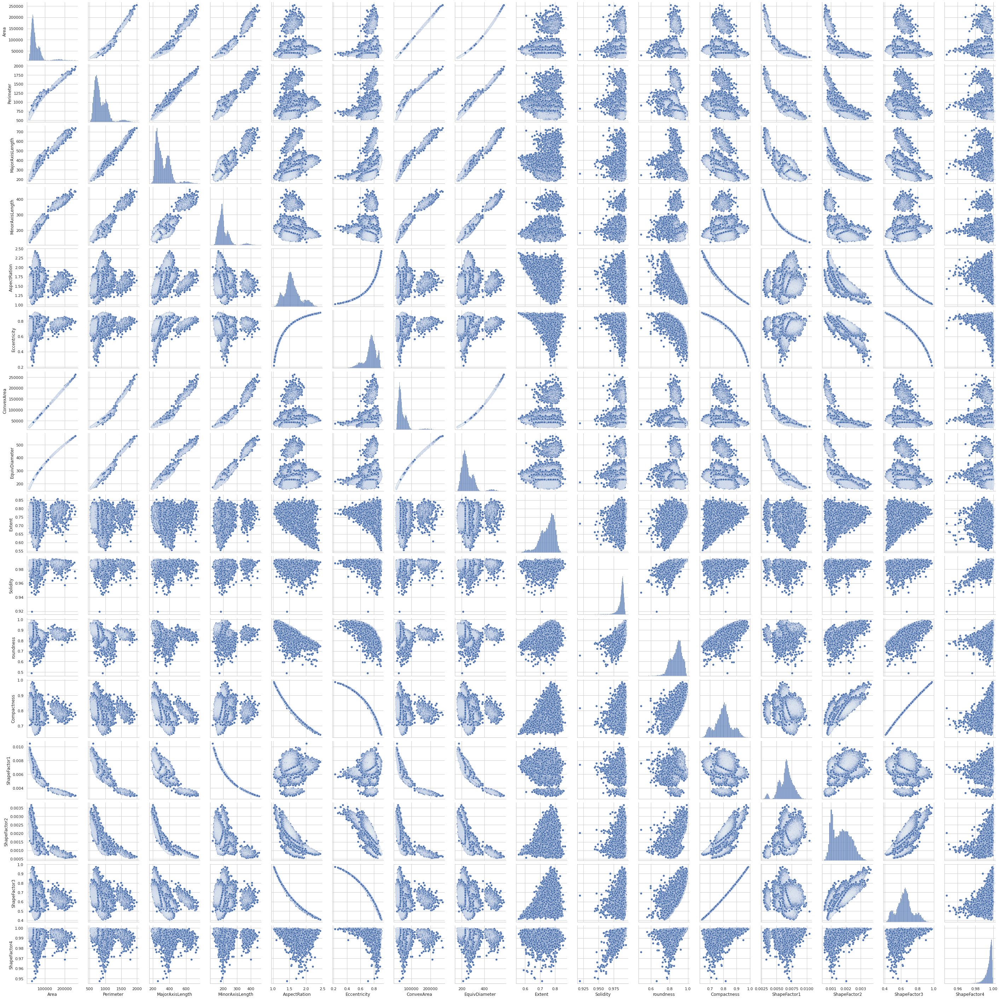

In [ ]:
# building a dataframe including all features except the outcome class variable
I = df.drop(['Class'], axis=1)

# use seaborn's pairlot to see all possible relationships in data
sns.pairplot(I)

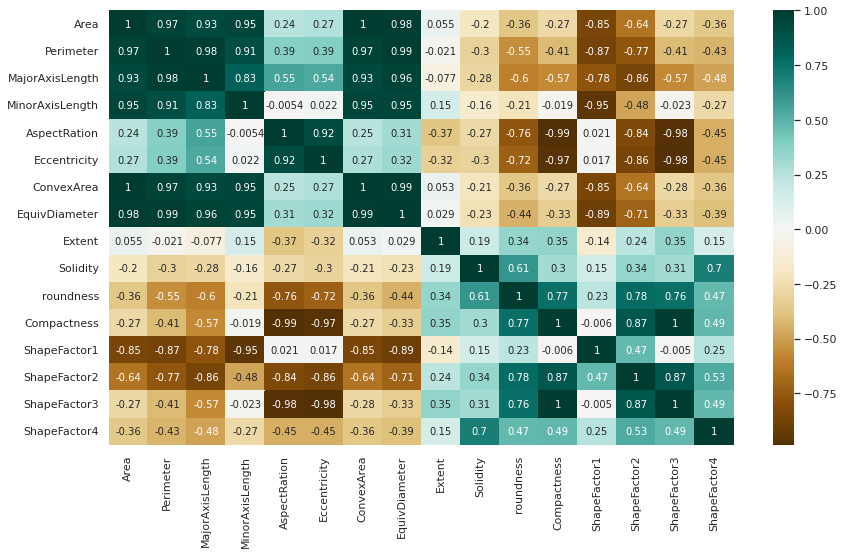

In [ ]:
#checking for Multi-collinearity/ correlation/ independence between predictor variables
plt.figure(figsize=(14,8))
c= df.corr()
sns.heatmap(c,cmap="BrBG",annot=True)

In 'df' dataframe so many features are having moderete to strong correlation values [>0.8 or <-0.8]. <br>
But, we cant easily identify which feature are important and are having correlation with actual outcome class. And, therefore we can not blindly remove some of the feature from our dataset. On the other hand, We can try all combinations of the 16 features in preparing model and check relative accuracy of all of them. However, this will require to check us accuracy for all 2^16 models, which is computationally not justified. <br>
Alternatively, we can use PCA to make a model of independent features. But, in that case, we will lose interpretability of our model. <br>

So, here we will build our model using all the features. However, we will build models using different ML algorithms. And we will compare accuracies and other model performance parameters across these models. So, in our classification problem, we will build model using following ML algorithms with the help of Scikit-Learn library in Python: <br>
    1) Logistic Regression <br>
    2) Naive Bayes <br>
    3) Decision Trees <br>
    4) k-Nearest Neighbours <br>

As described above, for our Dry Bean Classification Problem, intuitively we expect less accuracy from Logistic regression and Naive Bayes algorithms based models compared to other mentioned models, as our predictors are not completely independent.

## **3. Models**

### **1) Logistic Regression**

In [ ]:
# defining dataset

# Dropping Class column from X, because we will assign them to y
X = df.drop(['Class'],axis=1)
X.tail()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222
13610,42159,772.237,295.142741,182.204716,1.619841,0.786693,42600,231.686223,0.788962,0.989648,0.888380,0.784997,0.007001,0.001640,0.616221,0.998180


In [ ]:
# Set y as Target class
y = df.Class
y.tail()

13606    DERMASON
13607    DERMASON
13608    DERMASON
13609    DERMASON
13610    DERMASON
Name: Class, dtype: object

In [ ]:
# Split the data into training and testing datasets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.1, stratify=y, random_state=1)

# Make a logistic regression model
m1 = LogisticRegression()

# fit the model on training datasets
m1.fit(X_train1,y_train1)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression()

In [ ]:
# Predict the classes of the testing data set
y_pred1 = m1.predict(X_test1)

# Compare the predicted classes to the actual test classes and finding out accuracy score
from sklearn.metrics import accuracy_score
print('Accuracy Score',accuracy_score(y_test1,y_pred1))

Accuracy Score 0.7217712177121771


So, we receive accuracy of 72.17 % in this model. However, if we check accuracy of model without any stratified option in train_test_split function then accuracy becomes little lower to around 70 %. So, we will continue to use stratify=T, which mitigates accuracy losses otherwise happen due to imbalanced and disproportinate class splits across folds. <br>

#### Visualizing feature coefficients for all individual class: <br>
This helps us to understand which features influence the most in particular class probability calculation and hence their class prediction.

In [ ]:
# Use zip to bring the column names and the np.transpose function to bring together the coefficients from the model
coeff_df1 = pd.DataFrame(zip(X.columns, np.transpose(m1.coef_.round(8))))
coeff_df1p= pd.DataFrame(coeff_df1[1].to_list(), columns = ['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'], index= X.columns)
coeff_df1p

,BARBUNYA,BOMBAY,CALI,DERMASON,HOROZ,SEKER,SIRA
Area,-7.079660e-03,-4.111350e-03,-5.067370e-03,8.358580e-03,-8.839940e-03,1.601568e-02,7.240600e-04
Perimeter,-1.393255e-02,-7.058114e-02,-2.700706e-02,6.159239e-02,7.435430e-03,2.248185e-02,2.001107e-02
MajorAxisLength,-1.133685e-02,-2.645036e-02,-5.495010e-03,2.291082e-02,1.307816e-02,-8.680000e-04,8.161240e-03
MinorAxisLength,-3.240280e-03,-1.681748e-02,-8.938420e-03,1.702585e-02,-9.821540e-03,1.708949e-02,4.702370e-03
AspectRation,-1.116000e-04,-2.090600e-04,-7.132000e-05,2.316200e-04,1.195000e-04,-1.885000e-05,5.971000e-05
Eccentricity,-4.548000e-05,-9.822000e-05,-3.607000e-05,1.259100e-04,2.260000e-05,-1.176000e-05,4.302000e-05
ConvexArea,7.400660e-03,5.288960e-03,5.602730e-03,-9.628300e-03,8.655910e-03,-1.625962e-02,-1.060340e-03
EquivDiameter,-6.229880e-03,-2.096703e-02,-7.831680e-03,2.006140e-02,-1.625630e-03,1.002919e-02,6.563630e-03
Extent,-3.893000e-05,-9.800000e-05,-4.745000e-05,1.228400e-04,-3.134000e-05,6.551000e-05,2.736000e-05
Solidity,-5.304000e-05,-1.309200e-04,-6.676000e-05,1.617600e-04,-2.300000e-05,7.574000e-05,3.622000e-05


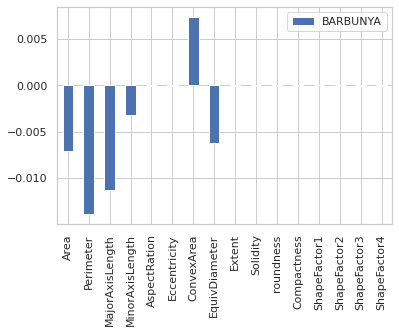

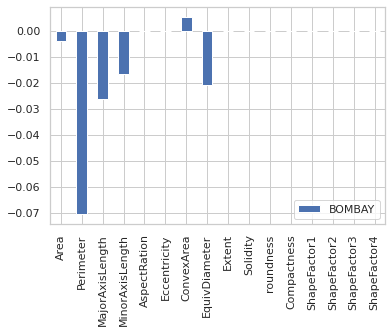

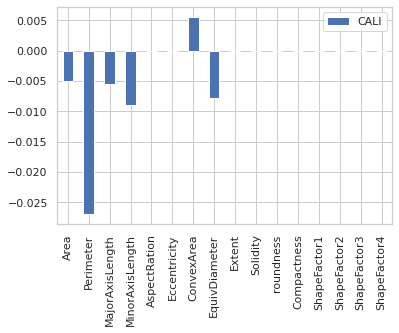

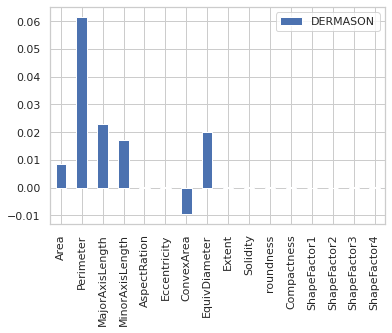

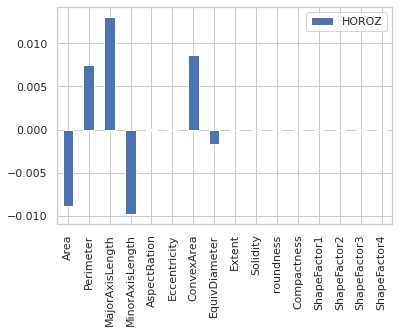

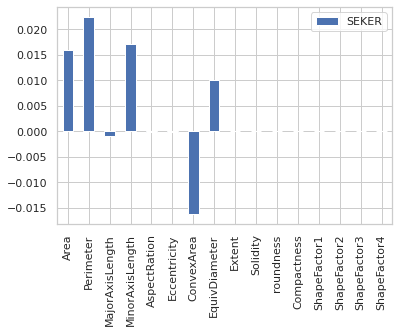

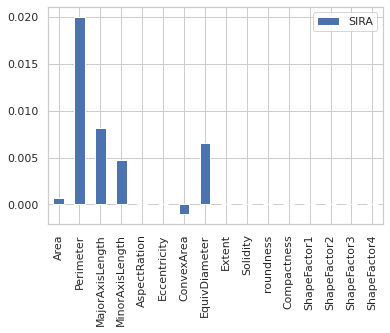

In [ ]:
# creating bar plots for each class one by one
for column in coeff_df1p.columns:
    coeff_df1p.plot.bar(y=column)

So, we can understand from above bar plots that which features impacts positively and negatively and upto what extent while obtaining probability value for an individual class.

#### Confusion Matrix:
In classification problem with unbalanced classes and as per some problem specific requirements, we also need to measure other performance parameters along with accuracy, which can be found based on confusion matrix.

In [ ]:
# construct confusion matrix

from sklearn.metrics import confusion_matrix
conf_matrix1 = confusion_matrix(y_test1, y_pred1)
cf_mx1 = pd.DataFrame(conf_matrix1, columns=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'], 
                                    index=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])
cf_mx1

,BARBUNYA,BOMBAY,CALI,DERMASON,HOROZ,SEKER,SIRA
BARBUNYA,70,0,40,0,21,1,0
BOMBAY,0,52,0,0,0,0,0
CALI,33,0,121,0,4,3,2
DERMASON,0,0,0,317,2,13,23
HOROZ,2,0,6,5,108,4,61
SEKER,0,0,0,39,4,137,23
SIRA,1,0,0,21,31,38,173


[Text(0, 0.5, 'BARBUNYA'),
 Text(0, 1.5, 'BOMBAY'),
 Text(0, 2.5, 'CALI'),
 Text(0, 3.5, 'DERMASON'),
 Text(0, 4.5, 'HOROZ'),
 Text(0, 5.5, 'SEKER'),
 Text(0, 6.5, 'SIRA')]

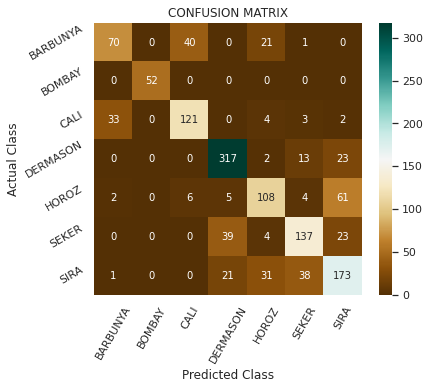

In [ ]:
# we can also visualize above confusion matrix as heatmap
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(conf_matrix1, annot=True, cmap="BrBG", fmt='g', ax=ax)

# labels, title and ticks
ax.set_xlabel('Predicted Class')
ax.set_ylabel('Actual Class')
ax.set_title('CONFUSION MATRIX')
plt.xticks(rotation=60)
plt.yticks(rotation=30)
ax.xaxis.set_ticklabels(['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])
ax.yaxis.set_ticklabels(['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])

#### Classification report:

In [ ]:
# we can also call classification_report function,
# to easily know precision, recall, f1-Score and support for each class,
# otherwise we could have also calculated them from confusion matrix obtained above
from sklearn.metrics import classification_report
print(classification_report(y_test1,y_pred1))


              precision    recall  f1-score   support

    BARBUNYA       0.66      0.53      0.59       132
      BOMBAY       1.00      1.00      1.00        52
        CALI       0.72      0.74      0.73       163
    DERMASON       0.83      0.89      0.86       355
       HOROZ       0.64      0.58      0.61       186
       SEKER       0.70      0.67      0.69       203
        SIRA       0.61      0.66      0.63       264

    accuracy                           0.72      1355
   macro avg       0.74      0.73      0.73      1355
weighted avg       0.72      0.72      0.72      1355



So, along with accuracy, we also need to keep in mind these confusion matrix based model performance parameters, while comparing different models, based on our problem specific requirements

#### K-fold Cross-Validation:

Now, We can also check accuracy and other model performance parameters using k-fold cross validation technique. Generally, we consider k=10 and therefore we will perform 10-fold cross validation here:

In [ ]:
# define the multinomial logistic regression model
m1b = LogisticRegression(multi_class='multinomial', solver='lbfgs')

# define the model evaluation procedure
# in the cross validation we are using Repeated Stratified K-Fold function
# this maintains the same class ratio throughout the K-folds as the ratio in our complete dataset
cv_data = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# evaluate the model and collect the scores, and specifying (-1) in n_jobs for parallelism in work
cv_scores_a = cross_val_score(m1b, X, y, scoring='accuracy', cv=cv_data, n_jobs=-1)

# report the model performance
print('Mean Accuracy : %.3f' % (np.mean(cv_scores_a)))

Mean Accuracy : 0.704


So, we observe that logistic regression model gives accuracy of 70.4 % when validated with 10-fold cross validation.

As we can observe, with cross-validation, model accuracy is less compared to what we had received without cross-validation above. So, it is always advisable to do cross-validation while measuring model performace.

### **2) Naive Bayes**

Now, we will fit Naive Bayes classifier on our dataset and find its accuracy, and other model performance parameters based on its confusion matrix

In our case, we have two options in Scikit-Learn to build Naive Bayes model. <br>
(i) Gaussian NB, and <br>
(ii) Mutlinomial NB <br>

Generally, Gaussian NB provides better prediction when the features are in decimal form, whereas, Mutlinomial NB provides better accuracy when the features have discrete values. In our case, we have both type of attributes. But, most of the features are in decimal form, so we expect Gaussian NB to provide better accurate model. So, without any further ado, let us implement both models one by one and check their prediction accuracies.

#### **(i) Using Gaussian NB:**

In [ ]:
# Split the data into training and testing datasets
X_train2a, X_test2a, y_train2a, y_test2a = train_test_split(X, y, test_size=0.1, stratify=y, random_state=1)

# Make a Naive Bayes prediction model
m2a = GaussianNB()

# fit the model on training datasets
m2a.fit(X_train2a, y_train2a)

GaussianNB()

In [ ]:
# Predict the classes of the testing data set
y_pred2a = m2a.predict(X_test2a)

# Compare the predicted classes to the actual test classes and finding out accuracy score
from sklearn.metrics import accuracy_score
print('Accuracy Score',accuracy_score(y_test2a,y_pred2a))

Accuracy Score 0.7756457564575646


So, we are getting here accuracy score of 77.56 %

#### Confusion Matrix:

In [ ]:
# construct confusion matrix

from sklearn.metrics import confusion_matrix
conf_matrix2a = confusion_matrix(y_test2a, y_pred2a)
cf_mx2a = pd.DataFrame(conf_matrix2a, columns=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'], 
                                    index=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])
cf_mx2a

,BARBUNYA,BOMBAY,CALI,DERMASON,HOROZ,SEKER,SIRA
BARBUNYA,65,0,53,0,11,0,3
BOMBAY,0,52,0,0,0,0,0
CALI,19,0,134,0,8,0,2
DERMASON,0,0,0,304,0,40,11
HOROZ,6,0,8,3,150,0,19
SEKER,1,0,0,28,3,139,32
SIRA,0,0,0,18,21,18,207


#### Classification report:

In [ ]:
# we can also call classification_report function,
# to easily know precision, recall, f1-Score and support for each class,
# otherwise we could have also calculated them from confusion matrix obtained above
from sklearn.metrics import classification_report
print(classification_report(y_test2a,y_pred2a))

              precision    recall  f1-score   support

    BARBUNYA       0.71      0.49      0.58       132
      BOMBAY       1.00      1.00      1.00        52
        CALI       0.69      0.82      0.75       163
    DERMASON       0.86      0.86      0.86       355
       HOROZ       0.78      0.81      0.79       186
       SEKER       0.71      0.68      0.69       203
        SIRA       0.76      0.78      0.77       264

    accuracy                           0.78      1355
   macro avg       0.79      0.78      0.78      1355
weighted avg       0.78      0.78      0.77      1355



#### **(ii) Using Mutlinomial NB:**

In [ ]:
# Split the data into training and testing datasets
X_train2b, X_test2b, y_train2b, y_test2b = train_test_split(X, y, test_size=0.1, stratify=y, random_state=1)

# Make a Naive Bayes prediction model
m2b = MultinomialNB()

# fit the model on training datasets
m2b.fit(X_train2b, y_train2b)

MultinomialNB()

In [ ]:
# Predict the classes of the testing data set
y_pred2b = m2b.predict(X_test2b)

# Compare the predicted classes to the actual test classes and finding out accuracy score
from sklearn.metrics import accuracy_score
print('Accuracy Score',accuracy_score(y_test2b,y_pred2b))

Accuracy Score 0.7940959409594096


So, we are getting here accuracy score of 79.4 %

#### Confusion Matrix:

In [ ]:
# construct confusion matrix

from sklearn.metrics import confusion_matrix
conf_matrix2b = confusion_matrix(y_test2b, y_pred2b)
cf_mx2b = pd.DataFrame(conf_matrix2b, columns=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'], 
                                    index=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])
cf_mx2b

,BARBUNYA,BOMBAY,CALI,DERMASON,HOROZ,SEKER,SIRA
BARBUNYA,81,0,37,0,10,0,4
BOMBAY,0,52,0,0,0,0,0
CALI,34,0,123,0,4,0,2
DERMASON,0,0,0,304,0,25,26
HOROZ,8,0,2,6,152,0,18
SEKER,2,0,0,15,0,153,33
SIRA,0,0,0,23,19,11,211


#### Classification report:

In [ ]:
# we can also call classification_report function,
# to easily know precision, recall, f1-Score and support for each class,
# otherwise we could have also calculated them from confusion matrix obtained above
from sklearn.metrics import classification_report
print(classification_report(y_test2b,y_pred2b))

              precision    recall  f1-score   support

    BARBUNYA       0.65      0.61      0.63       132
      BOMBAY       1.00      1.00      1.00        52
        CALI       0.76      0.75      0.76       163
    DERMASON       0.87      0.86      0.86       355
       HOROZ       0.82      0.82      0.82       186
       SEKER       0.81      0.75      0.78       203
        SIRA       0.72      0.80      0.76       264

    accuracy                           0.79      1355
   macro avg       0.80      0.80      0.80      1355
weighted avg       0.80      0.79      0.79      1355



Contrary to what we had expected, Multinomial-NB model is giving us higher accuracy (79.4 %) compared to Gaussian-NB model (77.6 %). However, both model has different precision and recall values for each class. So, depending upon use-case and specific model performance parameter criticality, we can select and use model out of these two sub-classifiers.

#### Accuracy verification through 10-fold repeated Cross-validation:

In [ ]:
m2c = MultinomialNB()

# define the model evaluation procedure
# in the cross validation we are using Repeated Stratified K-Fold function
# this maintains the same class ratio throughout the K-folds as the ratio in our complete dataset
cv_data = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# evaluate the model and collect the scores, and specifying (-1) in n_jobs for parallelism in work
cv_scores_a = cross_val_score(m2c, X, y, scoring='accuracy', cv=cv_data, n_jobs=-1)

# report the model performance
print('Mean Accuracy : %.3f' % (np.mean(cv_scores_a)))

Mean Accuracy : 0.784


So, we get 78.4 % accuracy in (Multinomial) Naive Bayes Classifier with 10-fold repeated cross-validation.

### **3) Decision Trees**

#### **(a) Normal Decision Tree Model:**

In [ ]:
# Split the data into training and testing datasets
X_train3, X_test3, y_train3, y_test3 = train_test_split(X, y, test_size=0.1, stratify=y, random_state=1)

# create instance of decision tree classifier
# set min_samples_split to 120 to avoid overfitting and limit iteration
m3 = DecisionTreeClassifier(min_samples_split=120)

# fit the model on training datasets
m3.fit(X_train3, y_train3)

DecisionTreeClassifier(min_samples_split=120)

In [ ]:
# Predict the classes of the testing data set
y_pred3 = m3.predict(X_test3)

# Compare the predicted classes to the actual test classes and finding out accuracy score
from sklearn.metrics import accuracy_score
print('Accuracy Score',accuracy_score(y_test3,y_pred3))

Accuracy Score 0.9114391143911439


So, we are getting here accuracy score of 91.14 %

#### Plotting the Decision Tree:

In [ ]:
import imageio,io
import pydotplus

# write function to plot the decision tree
def show_tree(tree, features, path):
  
  f = io.StringIO() # make file stream to read/write

  # export the graph into dot format and save it to the io stream
  export_graphviz(tree, out_file=f, feature_names=features,
                  class_names=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'],
                  filled=True, rounded=True) # for nicer visualization

  # read the dot data and trnasform it into a png, then save it to path
  pydotplus.graph_from_dot_data(f.getvalue()).write_png(path)

  # read the png image saved at path
  img = imageio.imread(path)

  # plot the png image in the notebook
  plt.rcParams['figure.figsize'] = (100,50)

  plt.imshow(img)

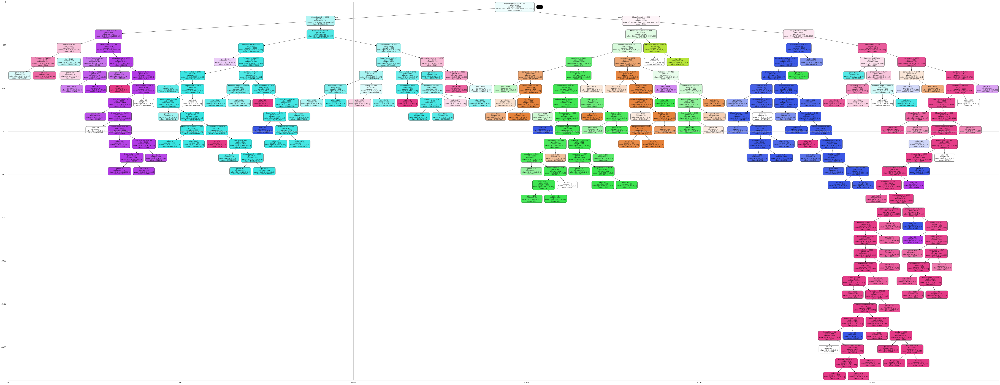

In [ ]:
# plot the decision tree
show_tree(m3,X.columns.to_list(),'decision_tree')

#### Confusion Matrix:

In [ ]:
# construct confusion matrix

from sklearn.metrics import confusion_matrix
conf_matrix3 = confusion_matrix(y_test3, y_pred3)
cf_mx3 = pd.DataFrame(conf_matrix3, columns=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'], 
                                    index=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])
cf_mx3

,BARBUNYA,BOMBAY,CALI,DERMASON,HOROZ,SEKER,SIRA
BARBUNYA,123,0,8,0,0,1,0
BOMBAY,0,52,0,0,0,0,0
CALI,9,0,148,0,3,2,1
DERMASON,0,0,0,329,0,8,18
HOROZ,0,0,7,2,174,0,3
SEKER,1,0,0,4,0,190,8
SIRA,0,0,0,35,4,6,219


#### Classification report:

In [ ]:
# we can also call classification_report function,
# to easily know precision, recall, f1-Score and support for each class,
# otherwise we could have also calculated them from confusion matrix obtained above
from sklearn.metrics import classification_report
print(classification_report(y_test3,y_pred3))

              precision    recall  f1-score   support

    BARBUNYA       0.92      0.93      0.93       132
      BOMBAY       1.00      1.00      1.00        52
        CALI       0.91      0.91      0.91       163
    DERMASON       0.89      0.93      0.91       355
       HOROZ       0.96      0.94      0.95       186
       SEKER       0.92      0.94      0.93       203
        SIRA       0.88      0.83      0.85       264

    accuracy                           0.91      1355
   macro avg       0.93      0.92      0.92      1355
weighted avg       0.91      0.91      0.91      1355



#### Accuracy verification through 10-fold repeated Cross-validation:

In [ ]:
m3b = DecisionTreeClassifier(min_samples_split=120)

# define the model evaluation procedure
# in the cross validation we are using Repeated Stratified K-Fold function
# this maintains the same class ratio throughout the K-folds as the ratio in our complete dataset
cv_data = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# evaluate the model and collect the scores, and specifying (-1) in n_jobs for parallelism in work
cv_scores_a = cross_val_score(m3b, X, y, scoring='accuracy', cv=cv_data, n_jobs=-1)

# report the model performance
print('Mean Accuracy : %.3f' % (np.mean(cv_scores_a)))

Mean Accuracy : 0.904


So, we get 90.4 % accuracy in Decision Tree Classifier with 10-fold repeated cross-validation.

#### **(b) Optimised Decision Tree Model:**

In [ ]:
# create instance of decision tree classifier
# set min_samples_split to 100 to avoid overfitting and limit iteration
# set criterion to entropy
# set max depth to 8 (selected after trying all values of max depth which brings maximum CV accuracy)
clf = DecisionTreeClassifier(min_samples_split=120, 
                             criterion='entropy', 
                             max_depth=8)

cv_data = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# evaluate the model and collect the scores, and specifying (-1) in n_jobs for parallelism in work
cv_scores_a = cross_val_score(clf, X, y, scoring='accuracy', cv=cv_data, n_jobs=-1)

# report the model performance
print('Mean Accuracy with parameter tuning: " : %.3f' % (np.mean(cv_scores_a)))


Mean Accuracy with parameter tuning: " : 0.906


So, we get 90.6 % accuracy with parameter tuninng in decision tree, which is slightly higher than what we had received in normal decision tree model (90.4 %).

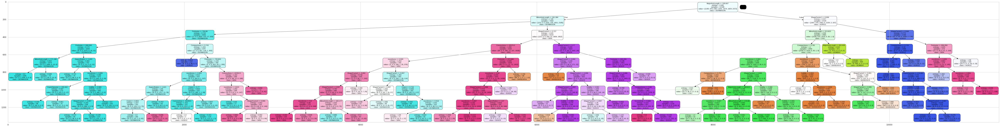

In [ ]:
# train the model
clf.fit(X_train3,y_train3)

# plot the decision tree
show_tree(clf,X.columns.to_list(),'optimised_decision_tree')

#### **(c) Random Forest Classifier Model:**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

# create instance of random forest classifier
# set criterion to entropy
# set max depth to 20
# set random state to 1 to get some result everytime
rf = RandomForestClassifier(criterion="entropy", max_depth=20, random_state=1)

# train model
rf.fit(X_train3,y_train3)

# predict testing data using model
rf_pred3 = rf.predict(X_test3)

# get the accurancy
rf_accuracy  = accuracy_score(y_test3,rf_pred3)

print("Accuracy with Random Forest Classifier: ", rf_accuracy*100 )

Accuracy with Random Forest Classifier:  92.84132841328413


So, we are getting here accuracy score of 92.84 %

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.596664 to fit



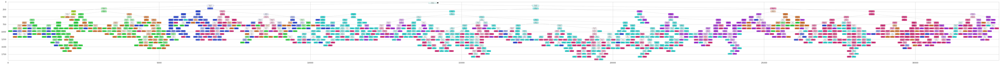

In [ ]:
# plot the decision tree
show_tree(rf.estimators_[0],X.columns.to_list(),'random_forest')

#### Confusion Matrix:

In [ ]:
# construct confusion matrix

from sklearn.metrics import confusion_matrix
conf_matrix3r = confusion_matrix(y_test3, rf_pred3)
cf_mx3r = pd.DataFrame(conf_matrix3r, columns=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'], 
                                    index=['BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SEKER','SIRA'])
cf_mx3r

,BARBUNYA,BOMBAY,CALI,DERMASON,HOROZ,SEKER,SIRA
BARBUNYA,121,0,8,0,1,2,0
BOMBAY,0,52,0,0,0,0,0
CALI,3,0,153,0,4,2,1
DERMASON,0,0,0,336,0,4,15
HOROZ,0,0,5,2,171,0,8
SEKER,0,0,0,3,0,195,5
SIRA,0,0,0,28,2,4,230


In [ ]:
# Accuracies for each class can be calculated as below:
Class_Accu = pd.DataFrame(zip(cf_mx3r.columns,
                    np.transpose((conf_matrix3r.diagonal()/conf_matrix3r.sum(axis=1)*100).round(2))))
Class_Accu

,0,1
0,BARBUNYA,91.67
1,BOMBAY,100.00
2,CALI,93.87
3,DERMASON,94.65
4,HOROZ,91.94
5,SEKER,96.06
6,SIRA,87.12


#### Classification Report:

In [ ]:
# we can also call classification_report function,
# to easily know precision, recall, f1-Score and support for each class,

from sklearn.metrics import classification_report
print(classification_report(y_test3,rf_pred3))

              precision    recall  f1-score   support

    BARBUNYA       0.98      0.92      0.95       132
      BOMBAY       1.00      1.00      1.00        52
        CALI       0.92      0.94      0.93       163
    DERMASON       0.91      0.95      0.93       355
       HOROZ       0.96      0.92      0.94       186
       SEKER       0.94      0.96      0.95       203
        SIRA       0.89      0.87      0.88       264

    accuracy                           0.93      1355
   macro avg       0.94      0.94      0.94      1355
weighted avg       0.93      0.93      0.93      1355



#### Accuracy verification through 10-fold repeated Cross-validation:

In [ ]:
m3d = RandomForestClassifier(criterion="entropy", max_depth=20, random_state=1)

# define the model evaluation procedure
# in the cross validation we are using Repeated Stratified K-Fold function
# this maintains the same class ratio throughout the K-folds as the ratio in our complete dataset
cv_data = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# evaluate the model and collect the scores, and specifying (-1) in n_jobs for parallelism in work
cv_scores_a = cross_val_score(m3d, X, y, scoring='accuracy', cv=cv_data, n_jobs=-1)

# report the model performance
print('Mean Accuracy : %.3f' % (np.mean(cv_scores_a)))

Mean Accuracy : 0.925


So, we are getting 92.5 % as the accuracy from Random forest classifier in repeated 10-fold Cross validation. And thus we can say that we are getting slightly higher accuracy with random forest compared to our optimised decision tree classifier model, which had given us 90.6 % accuracy in repeated 10-fold cross-validation.

### **4) k-Nearest Neighbours**

In [ ]:
# define data splits between train and test datasets 
X_train4, X_test4, y_train4, y_test4 = train_test_split(X, y, test_size=0.1, stratify=y, random_state=1)

#Setup arrays to store training and test accuracies
neighbors = np.arange(1,20)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
    knn.fit(X_train4,y_train4)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train4,y_train4)
    
    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test4,y_test4)

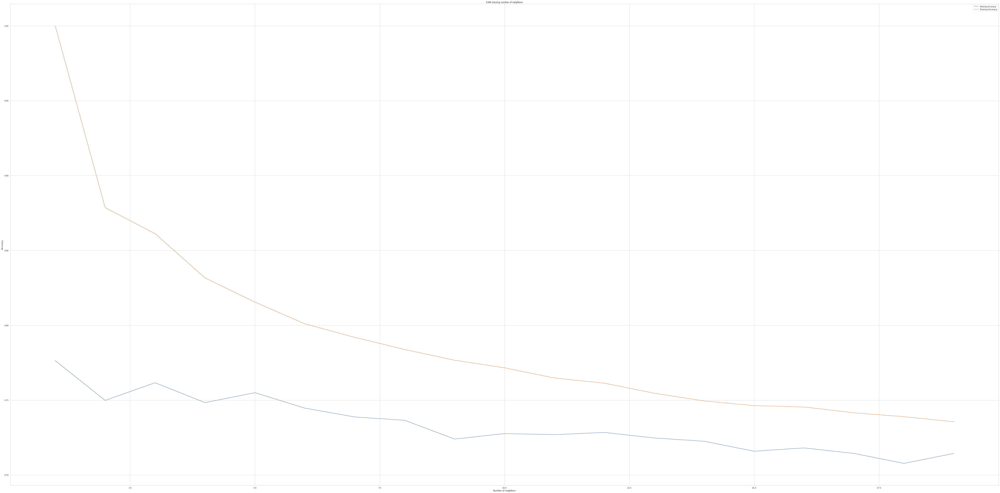

In [ ]:
#Generate plot
plt.plot(neighbors,test_accuracy,label='Testing Accuracy')
plt.plot(neighbors,train_accuracy,label='Training Accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.title('K-NN Varying number of neighbors')
plt.show()

We can observe above that we get reasonably good training and testing accuracy scores for k=5. So let's create a "K-Nearest Neighbors Classifier" with number of neighbors as 5.

In [ ]:
#Setup a knn classifier with k neighbors
knn = KNeighborsClassifier(n_neighbors=5)

In [ ]:
#Fit the model
knn.fit(X_train4,y_train4)

KNeighborsClassifier()

In [ ]:
#Get prediction accuracy
knn.score(X_test4,y_test4)

0.7549815498154981

So, here with this k value we are getting 75.49 % prediction accuracy on test dataset.

In [ ]:
# let us get the predictions using the classifier we had fit above
y_pred4 = knn.predict(X_test4)

In [ ]:
# generate and print the classification report
print(classification_report(y_test4,y_pred4))

              precision    recall  f1-score   support

    BARBUNYA       0.54      0.55      0.54       132
      BOMBAY       1.00      1.00      1.00        52
        CALI       0.63      0.61      0.62       163
    DERMASON       0.82      0.91      0.86       355
       HOROZ       0.77      0.71      0.74       186
       SEKER       0.87      0.70      0.78       203
        SIRA       0.72      0.77      0.74       264

    accuracy                           0.75      1355
   macro avg       0.76      0.75      0.75      1355
weighted avg       0.76      0.75      0.75      1355



#### Hyperparameter tuning: <br>
This exercise is necessary to find the best value of k, which gives us maximum value of cross-validated accuracy.

In [ ]:
# import GridSearchCV
from sklearn.model_selection import GridSearchCV

In [ ]:
#In case of classifier like knn the parameter to be tuned is n_neighbors
param_grid = {'n_neighbors':np.arange(1,20)}

In [ ]:
# create a knn classifier instance
knn = KNeighborsClassifier()

# create an instance of a grid search that has:
# - a knn model
# - grid paramter that specifies the number of neighbors we want to search
# - 5 folds for the cross validation
knn_cv = GridSearchCV(knn,param_grid,cv=5)

# use the features and the target to search the grid
knn_cv.fit(X,y)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])})

In [ ]:
# print the best score
knn_cv.best_score_

0.18946029237843326

In [ ]:
# print the paramter associated with the best score
knn_cv.best_params_

{'n_neighbors': 16}

So, with Cross-validation, we are getting max accuracy of just 18.94 % from k value of 16 as nearest neighbours. <br>
However this is little suspicious because we received earlier for k=5 more accuracy. However, that was just accuracy based on one test dataset. But in cross validation accuracy is becoming very less. <br>

*But, due to my suspicion that accuracy cant be this low, I tried looking for other range of k values and found that accuracy was again increasing and becoming maximum near the k value range of (4550, 4570). So, this suggests that CV accuracy has multiple local maxima and to find global maxima, we have to iterate k values from 1 to all the way to about 13000 (max no. of rows in dataset). however, this is computationally very time consuming for grid approach, so we narrowed down based on our calculations for different range and found the range of (4550, 4570) as possible k value which could give us global maxima of CV-accuracy score.*

In [ ]:
# select possible k value grid range as derived and mentioned above
param_grid = {'n_neighbors':np.arange(4550,4570)}

In [ ]:
# create a knn classifier instance
knn = KNeighborsClassifier()

# create an instance of a grid search that has:
# - a knn model
# - grid paramter that specifies the number of neighbors we want to search
# - 5 folds for the cross validation
knn_cv = GridSearchCV(knn,param_grid,cv=5)

# use the features and the target to search the grid
knn_cv.fit(X,y)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([4550, 4551, 4552, 4553, 4554, 4555, 4556, 4557, 4558, 4559, 4560,
       4561, 4562, 4563, 4564, 4565, 4566, 4567, 4568, 4569])})

In [ ]:
# print the best score
knn_cv.best_score_

0.522932993746432

In [ ]:
# print the paramter associated with the best score
knn_cv.best_params_

{'n_neighbors': 4564}

So, with KNN model, we got maximum Cross-validated prediction accuracy of 52.29 % with k=4564. Which is still a very less accuracy score compared to what we have received in Logistic Regression, Naive Bayes, and Decision Tree-Random Forest classfiers above.

## **4. Discussion**

First of all, let's discuss about accuracy of our models. Here, we will compare cross-validated accuracy of different models to get better idea of how each model would perform on future unseen data. So, below is the summary of cross-validated prediction accuracies we achieved through various classifiers in our project:<br>
1) Logistic Regression              : 70.4 % <br>
2) Naive Bayes                      : 78.4 % <br>
3) Decision Trees (Random Forest)   : 92.5 % <br>
4) k-Nearest Neighbours             : 52.3 % <br>

We can observe that Decision tree model is the best performing (92.5%) in terms of accuracy of prediction and is well suited for our future dry bean class prediction tasks. Also, Naive bayes model gives us good accuracy of around 78.4 %. However, comparatively, Logistic regression and k-Nearest Neighbours classifier do not provide us good prediction accuracy in this problem. As we had also mentioned earlier that our features are not perfectly independent, and that has given us less accuracies in logistic regression and naive bayes classifers, as expected, compared to Decision tree classifier. Also, k-Nearest Neighbours classifier's less CV accuracy can be understood as the classifier's inability to properly distinguish betweeen classes, as their features have very nearby values. <br> 

Now, talking about features, we can say that as we had observed in logistic regression coefficients barcharts that perimeter is the most influencial attribute in deciding probability of each class. I would like to add here that our most accurate model, Random Forest-decision tree has classified dry beans of each class with following accuracy values: BARBUNYA (91.67%), BOMBAY (100.0%), CALI (93.87%), DERMASON (94.65%), HOROZ (91.94%), SEKER (96.06%) and SIRA (87.12%). It is interesting to note that, 'Bombay' class has been consistently predicted with highest accuracy, precision, recall and f1-score through out all classifiers. This is justified because it has large differences in feature values from other classes, and therefore Bombay Class is easy to train and correctly predict for almost all classifiers.

To summarize, we can say that our problem of segregating dry beans of various class based on their morphological attribute using computer vision dataset is largely met using our Random Forest- Decision Tree ML classifier. So, this can be extremely beneficial in agricultural and production industry, wherein machine can automatically, accurately, speedily and uniformly decides dry beans, or dry seeds, class. As a result, this will reduce labour work and improve quality of production and farming at the same time.


References: <br>

[1] KOKLU, M. and OZKAN, I.A., (2020), “Multiclass Classification of Dry Beans Using Computer Vision
and Machine Learning Techniques.” Computers and Electronics in Agriculture, 174, 105507. DOI:
https://doi.org/10.1016/j.compag.2020.105507 <br>

[2] Dry Bean Dataset, UCI Machine Learning Repository (Center for Machine Learning and Intelligent
Systems, Bren School of Information and Computer Science, University of California, Irvine)
Accessed: June 20, 2022. [Online]. Available:
https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset